# BNB: Distance to a Sketched Region and Gene Expression Gradient Along it
Data is obtained from 10X Genomics

In [1]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

env: ANYWIDGET_HMR=1


In [14]:
from spatialdata_io import xenium
import spatialdata as sd
import scanpy as sc
import pandas as pd
import os
import geopandas as gpd
from shapely.geometry import Point
import json
import celldega as dega

import warnings
warnings.filterwarnings("ignore")

## Initialize data directory

In [4]:
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'

DATA_DIR = f'data/raw'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'data/landscape_files/{dataset_name}'

## Ingest raw data with spatialdata-io and write adata with spatialdata

In [5]:
# Ingest xenium data raw output folder using spatialdata-io
sdata = xenium(data_dir)

# Write sdata to a zarr file
zarr_path = f"{data_dir}.zarr"

# Check if the zarr file already exists
if os.path.exists(zarr_path):
    print(f"The file {zarr_path} already exists.")
else:
    # If the file does not exist, write the data
    sdata.write(zarr_path)
    print(f"Data written to {zarr_path} successfully.")

# Read zarr file using spatialdata
sdata = sd.read_zarr(zarr_path)

# Create anndata from sdata.tables['table]
adata = sdata.tables["table"]

INFO     reading data/raw/Xenium_V1_human_Pancreas_FFPE_outs/cell_feature_matrix.h5                                
The file data/raw/Xenium_V1_human_Pancreas_FFPE_outs.zarr already exists.


## Preprocessing with scanpy

In [6]:
# Filter cells and genes
sc.pp.filter_cells(adata, min_counts=10)
sc.pp.filter_genes(adata, min_cells=5)

# Derived data
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata)

# Write h5ad files
adata.write_h5ad(f'{data_dir}.h5ad')

## Get gdf_cell with cluster, spatial, and certain gene expressions

In [7]:
# Load h5ad file
adata = sc.read_h5ad(f'{data_dir}.h5ad')
adata.obs.set_index('cell_id', inplace=True)

# Extract gene expressions foro a gene list (handles sparse/dense matrices)
gene_list = ['EPCAM', 'AMY2A', 'GATM']

gene_exp = pd.DataFrame(
    data=adata[:, gene_list].X.toarray() if hasattr(adata.X, 'toarray') else adata[:, gene_list].X,
    columns=gene_list,
    index=adata.obs_names
)

# Create combined DataFrame with geometry
gdf_cell = gpd.GeoDataFrame(
    data={
        'cluster': adata.obs['leiden'],
        **gene_exp  # Unpacks all gene columns
    },
    geometry=[Point(xy) for xy in adata.obsm['spatial'][:, :2]],
    crs="EPSG:4326"  # Set your coordinate system here
)

## Load ROIs manually sketched in Celldega Landscape view

In [8]:
# Load Geo parquet
gdf_pixel = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_pixel.parquet')
gdf_micron = gpd.read_parquet(f'{path_landscape_files}/spatial_regions/sketched_regions_micron.parquet')

# Specify the polygon
roi_name = 'region_1'

# Select a ROI and calculate the distance from all cells to it

Extract the polygon for the specified ROI: region_1
Distances from points to polygon region_1 were calculated.
Plotting distances from points to polygon region_1...


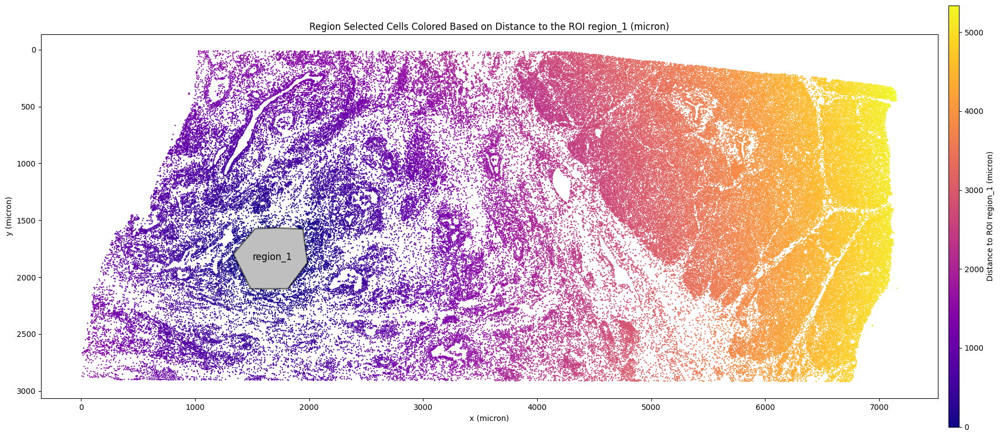

In [9]:
# Calculate distances
gdf_points_with_dist, gdf_polygon = dega.sp.calc_distance_to_roi(
    gdf_micron, 
    gdf_cell, 
    roi_name
)

# Plot distances
dega.sp.plot_distance_to_roi(
    gdf_points_with_dist, 
    gdf_polygon, 
    roi_name,
    markersize=0.5
)


## Plot gene expression gradient along the distance to selected ROI

Complete calculating gene exp. gradient from points to region_1 using 200 micron rings.
Plotting gene expression gradient from points to ROI region_1...


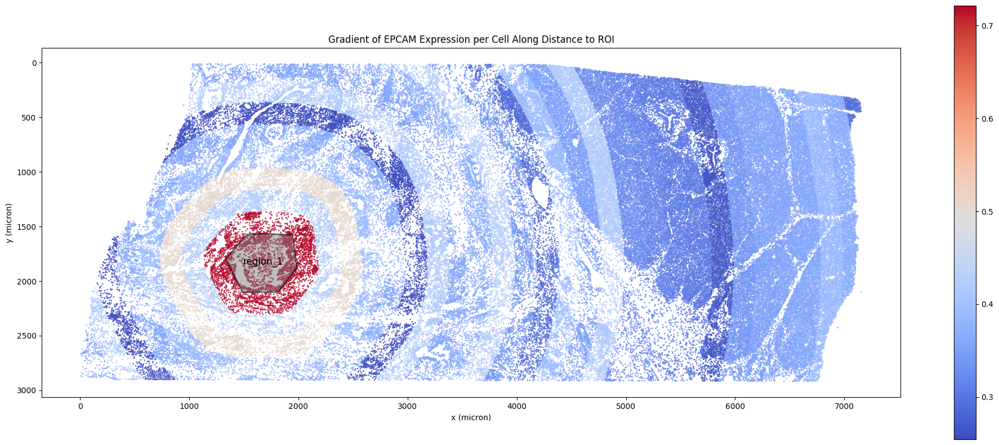

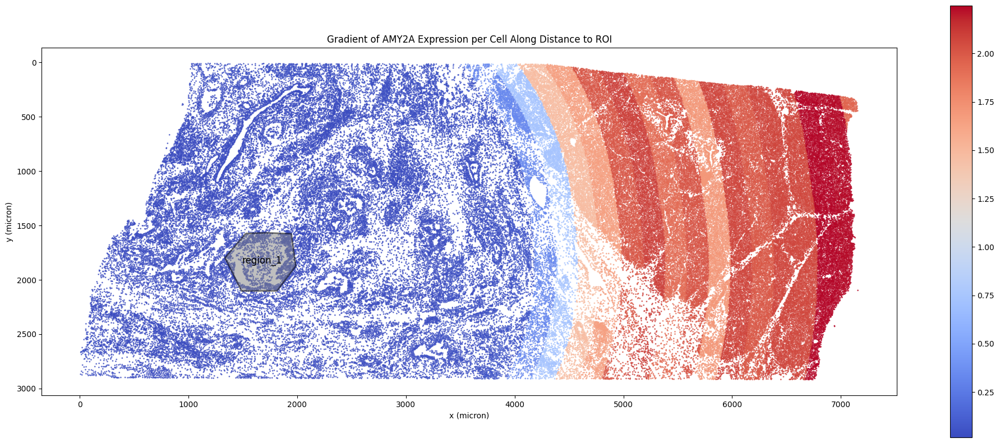

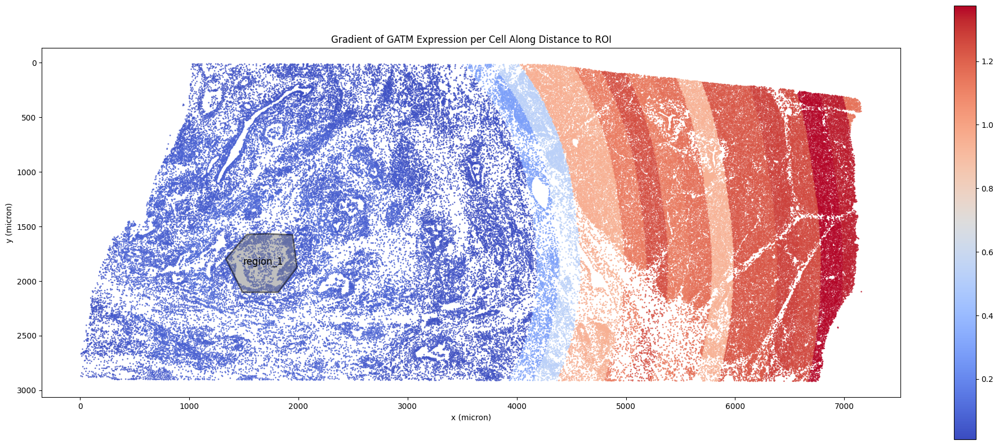

In [10]:

# Calculate gene gradients
band_width = 200
gdf_join_all, gdf_bands = dega.sp.calc_gene_expression_by_band(
    gdf_points_with_dist,
    gdf_polygon,
    roi_name,
    band_width=band_width,
    num_bands=5,
    gene_list=gene_list
)

# Plot gene gradients
dega.sp.plot_gene_gradient_to_roi(
    gdf_join_all,
    gdf_polygon,
    roi_name,
    gene_list=gene_list,
    markersize=1
)

# Save bands to Parquet
gradient_region_parquet_file_micron = f"{path_landscape_files}/gdf_{band_width}_um_bands_from_{roi_name}_micron.parquet"
gdf_bands.to_parquet(gradient_region_parquet_file_micron, engine="pyarrow")

<Axes: >

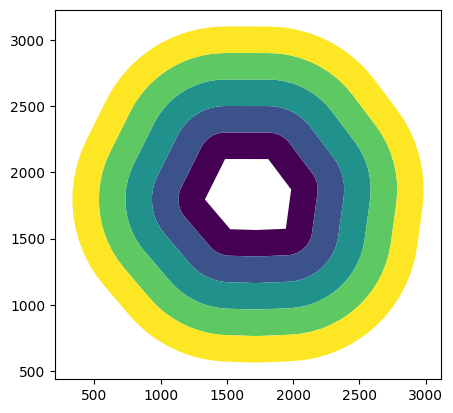

In [11]:
gdf_bands.plot('band', aspect=1)

In [ ]:
def gdf_band_pixel_from_gdf_roi_micron(gdf_micron,gdf_pixel, roi_name, band_width,conversion_factor):



In [22]:
def get_conversion_factor(gdf_micron, gdf_pixel, col='roi', val='region_1'):
    # micron space
    micron_polygon = gdf_micron[gdf_micron[col] == val]['geometry'].iloc[0]
    # pixel space
    pixel_polygon = gdf_pixel[gdf_pixel[col] == val]['geometry'].iloc[0]
    # Calculate the areas in microns and pixels
    micron_area = micron_polygon.area
    pixel_area = pixel_polygon.area
    # Calculate the conversion factor (square root of area ratio gives us length per pixel)
    return (micron_area / pixel_area) ** 0.5

In [ ]:
def create_band_pixel(gdf_micron, gdf_pixel, n_rings, band_width, json_fname, col='roi', val='region_1'):
    """
    Creates concentric bands in pixel space and saves as GeoJSON.
    
    Parameters:
    - gdf_micron: GeoDataFrame in micron coordinates
    - gdf_pixel: GeoDataFrame in pixel coordinates
    - n_rings: number of concentric rings to create
    - band_width: desired band width in microns
    - json_fname: output filename for GeoJSON
    - col: column name containing region identifiers
    - val: specific region value to process
    """
    
    # 1. Calculate conversion factor
    micron_poly = gdf_micron[gdf_micron[col] == val]['geometry'].iloc[0]
    pixel_poly = gdf_pixel[gdf_pixel[col] == val]['geometry'].iloc[0]
    conversion_factor = (micron_poly.area / pixel_poly.area) ** 0.5
    
    # 2. Create bands in pixel space (scaled by conversion factor)
    gdf_bands_pixel = dega.sp.create_concentric_rings(gdf_pixel, n_rings, band_width/conversion_factor)
    
    # 3. Save to GeoJSON
    gdf_bands_pixel.to_file(json_fname, driver='GeoJSON')
    return gdf_bands_pixel

<Axes: >

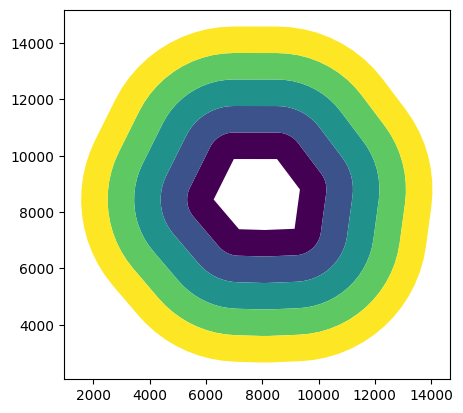

In [35]:
json_fname=f'{path_landscape_files}/bands_pixel.json'

gdf_bands = create_band(
    gdf_micron, 
    gdf_pixel, 
    n_rings=5,
    band_width=band_width, 
    json_fname=json_fname,
    col='roi', 
    val='region_1'
)

gdf_bands.plot('band', aspect=1)

## Visualize gradient in Landscape view

In [20]:
# Load and transform gradient regions (pixel space)
conversion_factor = dega.sp.get_conversion_factor(gdf_micron, gdf_pixel)
gdf_bands_pixel = dega.sp.create_concentric_rings(gdf_pixel, 5, band_width/conversion_factor)

# Save as GeoJSON
json_file = f"{path_landscape_files}/gdf_{band_width}_um_bands_from_{roi_name}_pixel_space.json"
gdf_bands_pixel.to_file(json_file, driver="GeoJSON")

# Load GeoJSON and add color
with open(json_file, 'r') as file:
    gradient_region = json.load(file)

# Step 1: Get all band values for normalization
bands = [feature['properties']['band'] for feature in gradient_region['features']]
min_band, max_band = min(bands), max(bands)

# Step 2: Assign shades of white
for feature in gradient_region['features']:
    band = feature['properties']['band']
    norm = (band - min_band) / (max_band - min_band) if max_band > min_band else 0.5
    base_color = 255  # Starting color for the lowest band (light gray)
    increment = 100    # Increment to reach white (255) at the highest band
    color_value = base_color - (norm * increment)
    color_value = max(color_value, 0)

    feature['properties']['color'] = [color_value, color_value, color_value, 170]  # RGBA

server_address = dega.viz.get_local_server()
base_url = f"http://localhost:{server_address}/{path_landscape_files}/"

landscape_ist = dega.Landscape(
    technology=tech,
    base_url = base_url,
    region=gradient_region,
    nbhd={},
)

landscape_ist

Server running on port 54433


Landscape(base_url='http://localhost:54433/data/landscape_files/Xenium_V1_human_Pancreas_FFPE_outs/', region={…